In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import matplotlib.pyplot as plt
import warnings
import seaborn as sns

plt.style.use('seaborn')
sns.set_palette('cubehelix')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

# Asset Allocation in Python

## Evaluating the performance of a basic 1/n portfolio

1. Import the libraries:

In [3]:
pip install pyfolio

  Created wheel for pyfolio: filename=pyfolio-0.9.2-py3-none-any.whl size=88684 sha256=0d2035d28056c406a87de127df0f43ce67df698ac9e2e3cc1dbcbd06b90198a1
  Stored in directory: c:\users\cti110016\appdata\local\pip\cache\wheels\42\16\92\9c9d49efccc497040268960f0825101cc9b1c6e41cdc5a409e
  Created wheel for empyrical: filename=empyrical-0.5.5-py3-none-any.whl size=39778 sha256=cc5191ecc9e88ccc8342667e131d63399e96bab94534f0195c710c3894e4518c
  Stored in directory: c:\users\cti110016\appdata\local\pip\cache\wheels\0d\68\bb\926065fb744e7d7cb67334cb1a9c696722abc8303e5dc9a8d0
Successfully built pyfolio empyrical
Note: you may need to restart the kernel to use updated packages.


In [4]:
import yfinance as yf
import numpy as np
import pandas as pd
import pyfolio as pf

C:\Users\cti110016\Anaconda3\lib\site-packages\pyfolio\pos.py:26: UserWarning: Module "zipline.assets" not found; mutltipliers will not be applied to position notionals.
  warnings.warn(


2. Set up the parameters:

In [5]:
RISKY_ASSETS = ['AAPL', 'IBM', 'MSFT', 'TWTR']
START_DATE = '2017-01-01'
END_DATE = '2018-12-31'

n_assets = len(RISKY_ASSETS)

3. Download the stock prices from Yahoo Finance:

[*********************100%***********************]  4 of 4 completed
Downloaded 501 rows of data.


<AxesSubplot:title={'center':'Stock prices of the considered assets'}, xlabel='Date'>

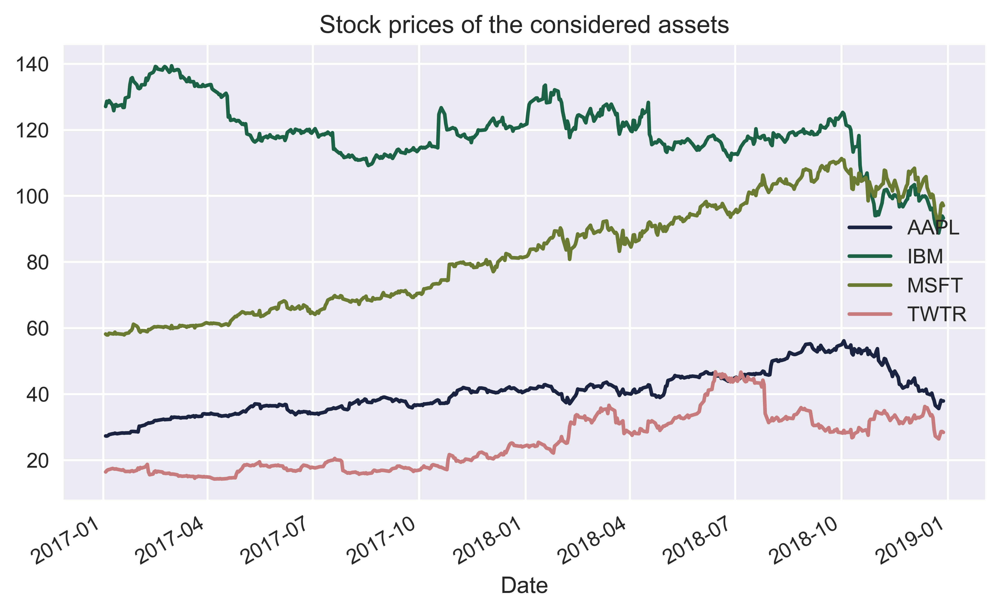

In [6]:
prices_df = yf.download(RISKY_ASSETS, start=START_DATE, 
                       end=END_DATE, adjusted=True)
print(f'Downloaded {prices_df.shape[0]} rows of data.')
prices_df['Adj Close'].plot(title='Stock prices of the considered assets')

4. Calculate individual asset returns:

In [7]:
returns = prices_df['Adj Close'].pct_change().dropna()

5. Define the weights:

In [8]:
portfolio_weights = n_assets * [1 / n_assets]

6. Calculate portfolio returns:

In [9]:
portfolio_returns = pd.Series(np.dot(portfolio_weights, returns.T), 
                             index=returns.index)

7. Create the tear sheet (simple variant):

In [10]:
pf.create_simple_tear_sheet(portfolio_returns)

Start date,2017-01-04
End date,2018-12-28
Total months,23
,Backtest
Annual return,17.7%
Cumulative returns,38.1%
Annual volatility,21.8%
Sharpe ratio,0.86
Calmar ratio,0.70
Stability,0.87
Max drawdown,-25.3%


## Finding the Efficient Frontier using Monte Carlo simulations

1. Import the libraries:

In [11]:
import yfinance as yf
import numpy as np
import pandas as pd

2. Set up the parameters:

In [12]:
N_PORTFOLIOS = 10 ** 5
N_DAYS = 252
RISKY_ASSETS = ['FB', 'TSLA', 'TWTR', 'MSFT']
RISKY_ASSETS.sort()
START_DATE = '2018-01-01'
END_DATE = '2018-12-31'

n_assets = len(RISKY_ASSETS)

3. Download the stock prices from Yahoo Finance:

In [13]:
prices_df = yf.download(RISKY_ASSETS, start=START_DATE, 
                       end=END_DATE, adjusted=True)
print(f'Downloaded {prices_df.shape[0]} rows of data.')

[*********************100%***********************]  4 of 4 completed
Downloaded 250 rows of data.


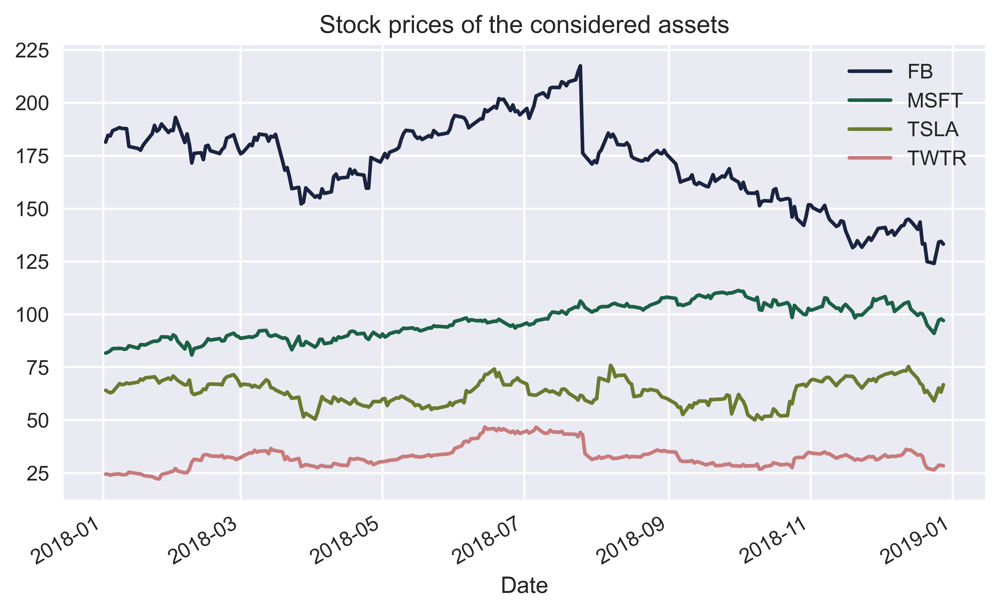

In [14]:
prices_df['Adj Close'].plot(title='Stock prices of the considered assets');

4. Calculate annualized average returns and the corresponding standard deviation:

In [15]:
returns_df = prices_df['Adj Close'].pct_change().dropna()

avg_returns = returns_df.mean() * N_DAYS
cov_mat = returns_df.cov() * N_DAYS

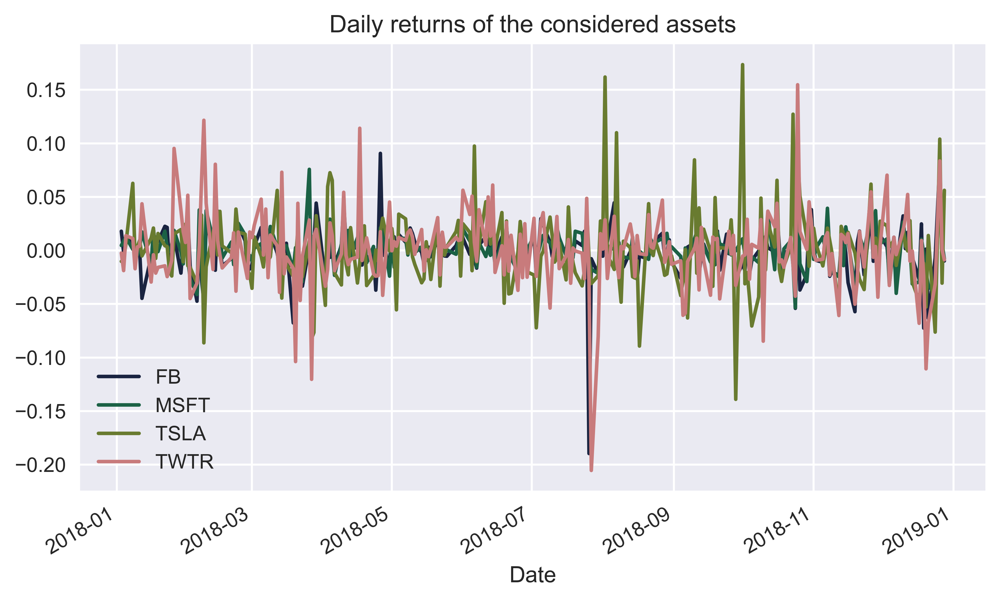

In [16]:
returns_df.plot(title='Daily returns of the considered assets');

5. Simulate random portfolio weights:

In [17]:
np.random.seed(42)
weights = np.random.random(size=(N_PORTFOLIOS, n_assets))
weights /=  np.sum(weights, axis=1)[:, np.newaxis]

6. Calculate portfolio metrics:

In [18]:
portf_rtns = np.dot(weights, avg_returns)

portf_vol = []
for i in range(0, len(weights)):
    portf_vol.append(np.sqrt(np.dot(weights[i].T, 
                                   np.dot(cov_mat, weights[i]))))
portf_vol = np.array(portf_vol)  
portf_sharpe_ratio = portf_rtns / portf_vol

7. Create a joint DataFrame with all data:

In [19]:
portf_results_df = pd.DataFrame({'returns': portf_rtns,
                                'volatility': portf_vol,
                                'sharpe_ratio': portf_sharpe_ratio})

8. Locate the points creating the Efficient Frontier:

In [20]:
N_POINTS = 100
portf_vol_ef = []
indices_to_skip = []

portf_rtns_ef = np.linspace(portf_results_df.returns.min(), 
                           portf_results_df.returns.max(), 
                           N_POINTS)
portf_rtns_ef = np.round(portf_rtns_ef, 2)    
portf_rtns = np.round(portf_rtns, 2)

for point_index in range(N_POINTS):
    if portf_rtns_ef[point_index] not in portf_rtns:
        indices_to_skip.append(point_index)
        continue
    matched_ind = np.where(portf_rtns == portf_rtns_ef[point_index])
    portf_vol_ef.append(np.min(portf_vol[matched_ind]))
        
portf_rtns_ef = np.delete(portf_rtns_ef, indices_to_skip)

9. Plot the Efficient Frontier:

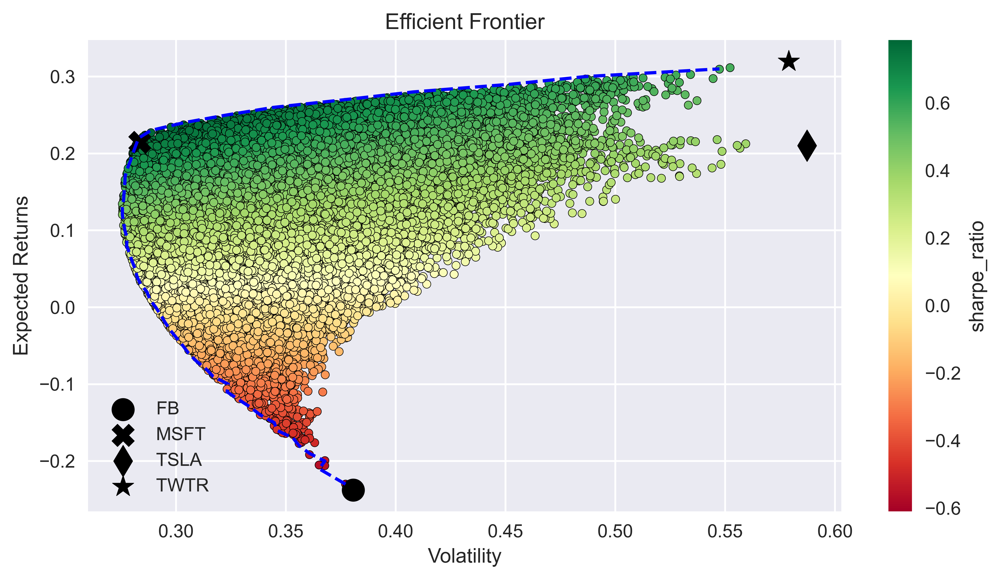

In [21]:
MARKS = ['o', 'X', 'd', '*']

fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                     y='returns', c='sharpe_ratio',
                     cmap='RdYlGn', edgecolors='black', 
                     ax=ax)
ax.set(xlabel='Volatility', 
      ylabel='Expected Returns', 
      title='Efficient Frontier')
ax.plot(portf_vol_ef, portf_rtns_ef, 'b--')
for asset_index in range(n_assets):
    ax.scatter(x=np.sqrt(cov_mat.iloc[asset_index, asset_index]), 
              y=avg_returns[asset_index], 
              marker=MARKS[asset_index], 
              s=150, 
              color='black',
              label=RISKY_ASSETS[asset_index])
ax.legend()
    
plt.tight_layout()
plt.show()

## Finding the Efficient Frontier using optimization with scipy

### This recipe requires running all the code from the recipe *Finding the Efficient Frontier using Monte Carlo simulations*.

1. Import the libraries:

In [22]:
import numpy as np
import scipy.optimize as sco

2. Define functions calculating portfolio returns and volatility:

In [23]:
def get_portf_rtn(w, avg_rtns):
    return np.sum(avg_rtns * w)

def get_portf_vol(w, avg_rtns, cov_mat):
    return np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))

3. Define the function calculating the efficient frontier:

In [24]:
def get_efficient_frontier(avg_rtns, cov_mat, rtns_range):
    
    efficient_portfolios = []
    
    n_assets = len(avg_returns)
    args = (avg_returns, cov_mat)
    bounds = tuple((0,1) for asset in range(n_assets))
    initial_guess = n_assets * [1. / n_assets, ]
    
    for ret in rtns_range:
        constraints = ({'type': 'eq', 
                       'fun': lambda x: get_portf_rtn(x, avg_rtns) - ret},
                      {'type': 'eq', 
                      'fun': lambda x: np.sum(x) - 1})
        efficient_portfolio = sco.minimize(get_portf_vol, initial_guess, 
                                          args=args, method='SLSQP', 
                                          constraints=constraints,
                                          bounds=bounds)
        efficient_portfolios.append(efficient_portfolio)
        
    return efficient_portfolios

4. Define the considered range of returns:

In [25]:
rtns_range = np.linspace(-0.22, 0.32, 200)

5. Calculate the Efficient Frontier:

In [26]:
efficient_portfolios = get_efficient_frontier(avg_returns, 
                                             cov_mat, 
                                             rtns_range)

6. Extract the volatilities of the efficient portfolios:

In [27]:
vols_range = [x['fun'] for x in efficient_portfolios]

7. Plot the calculated Efficient Frontier, together with the simulated portfolios:

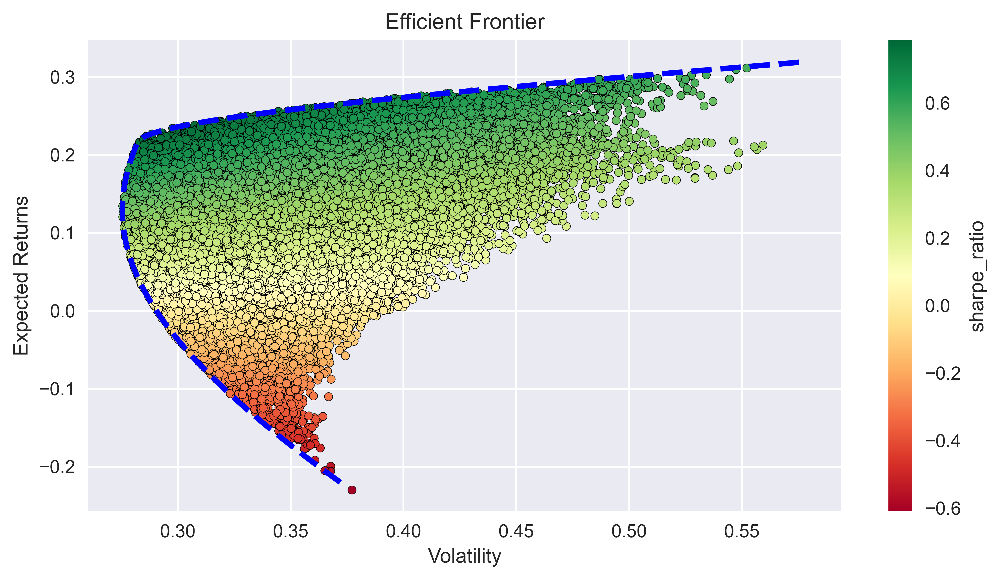

In [28]:
fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                     y='returns', c='sharpe_ratio',
                     cmap='RdYlGn', edgecolors='black', 
                     ax=ax)
ax.plot(vols_range, rtns_range, 'b--', linewidth=3)
ax.set(xlabel='Volatility', 
      ylabel='Expected Returns', 
      title='Efficient Frontier')

plt.tight_layout()
plt.show()

8. Identify the minimum volatility portfolio:

In [29]:
min_vol_ind = np.argmin(vols_range)
min_vol_portf_rtn = rtns_range[min_vol_ind]
min_vol_portf_vol = efficient_portfolios[min_vol_ind]['fun']

min_vol_portf = {'Return': min_vol_portf_rtn,
                'Volatility': min_vol_portf_vol,
                'Sharpe Ratio': (min_vol_portf_rtn / 
                                min_vol_portf_vol)}

min_vol_portf

{'Return': 0.13005025125628142,
 'Volatility': 0.2754157889285989,
 'Sharpe Ratio': 0.4721960631312852}

9. Print performance summary:

In [30]:
print('Minimum Volatility portfolio ----')
print('Performance')

for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
    
print('\nWeights')
for x, y in zip(RISKY_ASSETS, efficient_portfolios[min_vol_ind]['x']):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Minimum Volatility portfolio ----
Performance
Return: 13.01% Volatility: 27.54% Sharpe Ratio: 47.22% 
Weights
FB: 18.65% MSFT: 77.34% TSLA: 4.01% TWTR: 0.00% 